# Equity Maps

## Setup

In [1]:
library(RSQLCipher)
suppressMessages(library(lubridate))
suppressWarnings(suppressMessages(library(tidyverse)))
suppressWarnings(suppressMessages(library(lme4)))
suppressMessages(library(maptools))
suppressMessages(library(sf))

# import income functions
suppressMessages(source("../../src/income.R"))

select = dplyr::select
theme_set(theme_minimal())

In [2]:
Sys.setenv("SQL_KEY"=Sys.getenv("HOT_KEY"))
options(repr.plot.width=10, repr.plot.height=6, scipen=8)

In [30]:
fips_benefits = suppressMessages(read_csv("../../data/benefits/fips_benefits.csv"))

In [4]:
block_groups = st_read("../../data/shapefiles/block_groups/block_groups.shp")

Reading layer `block_groups' from data source `/Users/cmccartan/Documents/Analyses/dssg/shared/data/shapefiles/block_groups/block_groups.shp' using driver `ESRI Shapefile'
replacing null geometries with empty geometries
Simple feature collection with 3166 features and 1 field (with 2 geometries empty)
geometry type:  GEOMETRY
dimension:      XY
bbox:           xmin: -123.2031 ymin: 46.04017 xmax: -119.8656 ymax: 49.00249
epsg (SRID):    4326
proj4string:    +proj=longlat +datum=WGS84 +no_defs


In [5]:
road_line = st_read("../../data/shapefiles/roads500k/sr500k_20181231.shp") %>%
    filter(RouteID %in% c("005", "090", "099", "167", "405", "520", "522", "527")) %>%
    mutate(color = if_else(RouteID == "405", "red", "black")) %>%
    st_transform(4326)

Reading layer `sr500k_20181231' from data source `/Users/cmccartan/Documents/Analyses/dssg/shared/data/shapefiles/roads500k/sr500k_20181231.shp' using driver `ESRI Shapefile'
Simple feature collection with 280 features and 9 fields
geometry type:  MULTILINESTRING
dimension:      XYM
bbox:           xmin: 637196.4 ymin: 87432.2 xmax: 2514542 ymax: 1353104
epsg (SRID):    2927
proj4string:    +proj=lcc +lat_1=47.33333333333334 +lat_2=45.83333333333334 +lat_0=45.33333333333334 +lon_0=-120.5 +x_0=500000.0001016001 +y_0=0 +ellps=GRS80 +towgs84=0,0,0,0,0,0,0 +units=us-ft +no_defs


In [6]:
toll_line = st_zm(road_line) %>%
    filter(RouteID == "405") %>%
    st_crop(xmin=-180, xmax=0, ymin=47.615448, ymax=47.821815)

although coordinates are longitude/latitude, st_intersection assumes that they are planar
Warning message:
“attribute variables are assumed to be spatially constant throughout all geometries”

In [7]:
city_points = st_read("../../data/shapefiles/city_points/city_points.shp") %>%
    st_transform(4326)

Reading layer `city_points' from data source `/Users/cmccartan/Documents/Analyses/dssg/shared/data/shapefiles/city_points/city_points.shp' using driver `ESRI Shapefile'
Simple feature collection with 281 features and 8 fields
geometry type:  POINT
dimension:      XY
bbox:           xmin: 688453.7 ymin: 95236.93 xmax: 2511469 ymax: 1343072
epsg (SRID):    2927
proj4string:    +proj=lcc +lat_1=47.33333333333334 +lat_2=45.83333333333334 +lat_0=45.33333333333334 +lon_0=-120.5 +x_0=500000.0001016001 +y_0=0 +ellps=GRS80 +towgs84=0,0,0,0,0,0,0 +units=us-ft +no_defs


In [8]:
water = st_read("../../data/shapefiles/water/water_bodies.shp")

Reading layer `water_bodies' from data source `/Users/cmccartan/Documents/Analyses/dssg/shared/data/shapefiles/water/water_bodies.shp' using driver `ESRI Shapefile'
Simple feature collection with 31 features and 14 fields
geometry type:  MULTIPOLYGON
dimension:      XY
bbox:           xmin: -122.3975 ymin: 47.3226 xmax: -121.1829 ymax: 48.33113
epsg (SRID):    4326
proj4string:    +proj=longlat +datum=WGS84 +no_defs


## Plots

In [54]:
benefits_plots = fips_benefits %>%
    filter(county %in% c("King", "Snohomish"), is_hov==0) %>%
    mutate(fips = as.character(fips)) %>%
    left_join(block_groups, by=c("fips"="fips_code"))

Warning message:
“Column `fips`/`fips_code` joining character vector and factor, coercing into character vector”

In [10]:
plot_map = function(df, plot_var, title="", log=T, limits=c(NA, NA), plot_bg=F) {
    plot_var = enquo(plot_var)
    var_name = str_to_sentence(str_replace(str_replace(quo_name(plot_var), "s$", ""), "/", " / "))
    
    if (str_detect(var_name, "revenue|benefit"))
        labeler = scales::dollar
    else if (str_detect(var_name, "race"))
        labeler = scales::percent
    else if (str_detect(var_name, "inc"))
        labeler = function(x) scales::dollar(x*1000)
    else
        labeler = function(x) scales::number(x, accuracy=0.1)
        
    transf = if (log) "log" else "identity"
        
    # Remove Vashon
    bg = filter(block_groups, 
                !(fips_code %in% c("530330277021", "530330277024", "530330277013", "530330277011")),
                str_sub(fips_code, 4, 5) %in% c("33", "61"))
    
    ggplot(df) + 
        {if (plot_bg) geom_sf(fill="#777777", data=bg, lwd=0)} + 
        geom_sf(aes(fill=!!plot_var), lwd=0) + 
        geom_sf(fill="white", lwd=0, data=water) + 
        geom_sf(color="#eeeeee", data=toll_line, lwd=1.2) + 
        geom_sf(color="#333333", data=road_line, lwd=0.4) + 
        #suppressMessages(geom_sf_text(aes(label=NAME), color="white", size=2, data=city_points)) + 
        coord_sf(xlim=c(-122.414, -122.0), ylim=c(47.4, 47.95), datum=NA) +
        #scale_color_viridis_c(labels=scales::dollar)
        #scale_color_viridis_c(limits=c(0, 2.5), trans="log", oob=scales::squish) +
        scale_fill_viridis_c(limits=limits, trans=transf, labels=labeler, 
                             name=var_name, oob=scales::squish, position="left") +
        labs(title=title) +
        theme(axis.title.x=element_blank(),
              axis.text.x=element_blank(),
              axis.ticks.x=element_blank(),
              axis.title.y=element_blank(),
              axis.text.y=element_blank(),
              axis.ticks.y=element_blank())
}

# Usage and Revenue

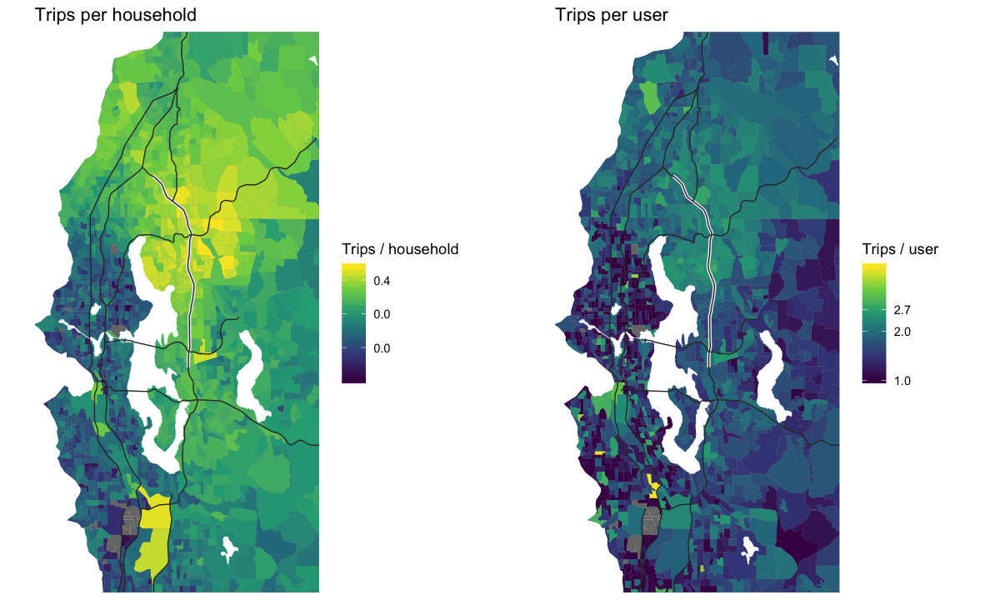

In [12]:
gridExtra::grid.arrange(
    plot_map(benefits_plots, trips/households, "Trips per household", plot_bg=T),
    plot_map(benefits_plots, trips/users, "Trips per user", limits=c(1, 5), plot_bg=T),
nrow=1)

In [178]:
ggsave("../../../img/trips_household_map.png", width=4, height=7, dpi=320)

Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.
Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.
Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.


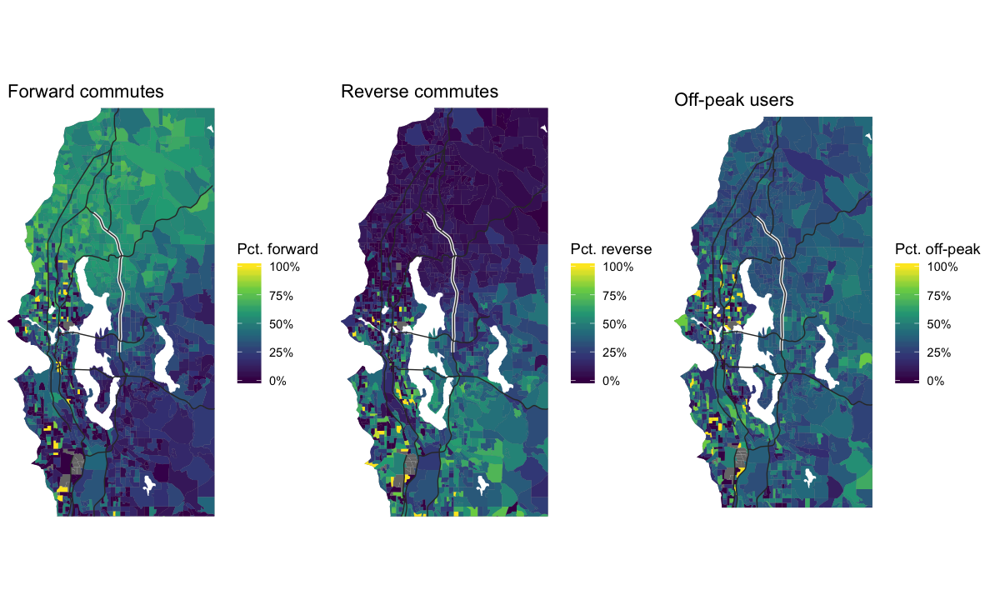

In [59]:
p1 = plot_map(benefits_plots, (am_peak_trips+pm_peak_trips)/trips, "Forward commutes", plot_bg=T) + 
    scale_fill_continuous(labels=scales::percent, name="Pct. forward")
p2 = plot_map(benefits_plots, rev_comm_trips/trips, "Reverse commutes", plot_bg=T) +
    scale_fill_continuous(labels=scales::percent, name="Pct. reverse")
p3 = plot_map(benefits_plots, off_peak_trips/trips, "Off-peak users", plot_bg=T) +
    scale_fill_continuous(labels=scales::percent, name="Pct. off-peak")

gridExtra::grid.arrange(p1, p2, p3, nrow=1)

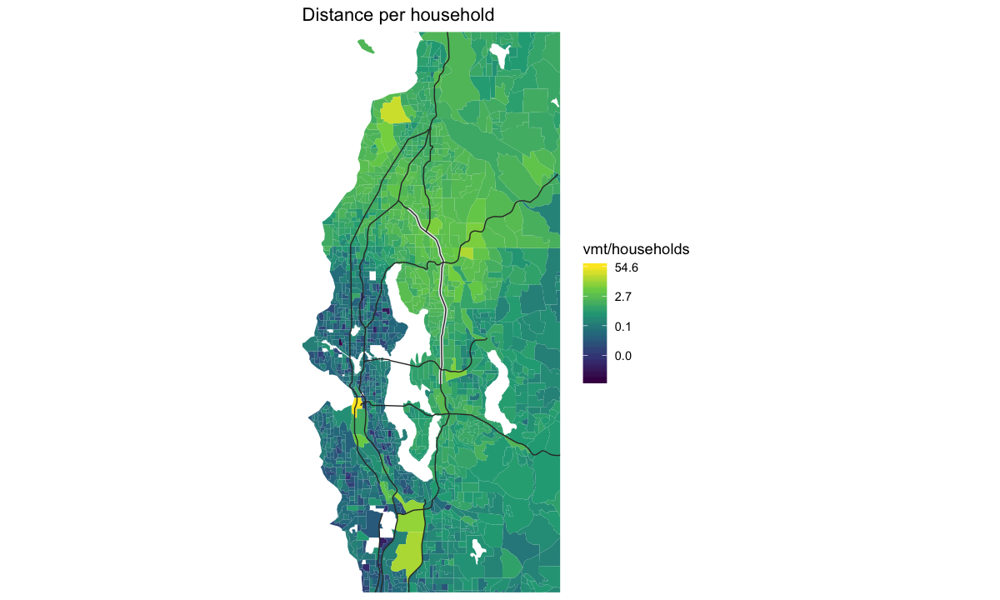

In [14]:
plot_map(benefits_plots, vmt/households, "Distance per household")

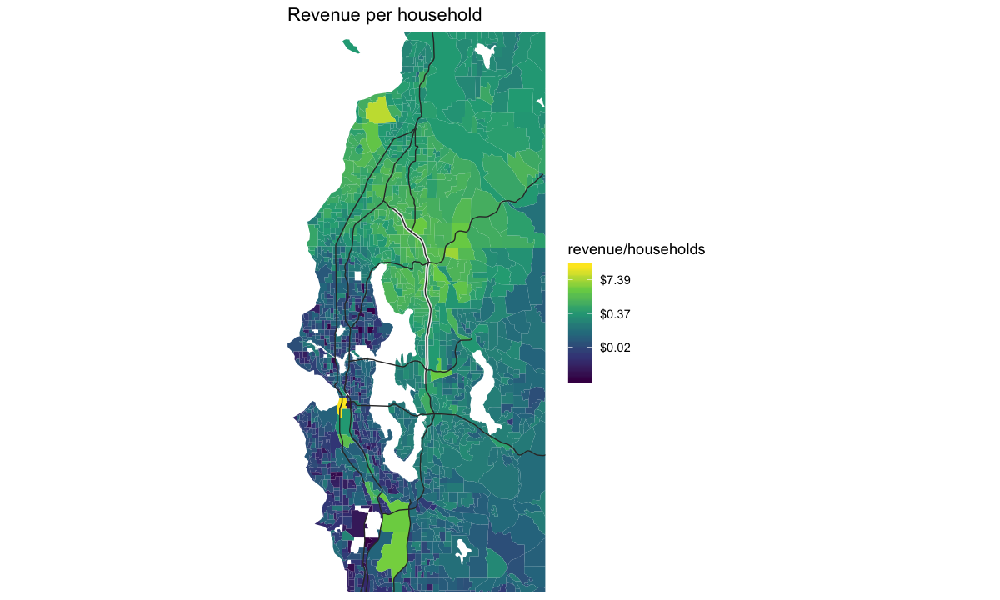

In [16]:
plot_map(benefits_plots, revenue/households, "Revenue per household")

Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.
Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.


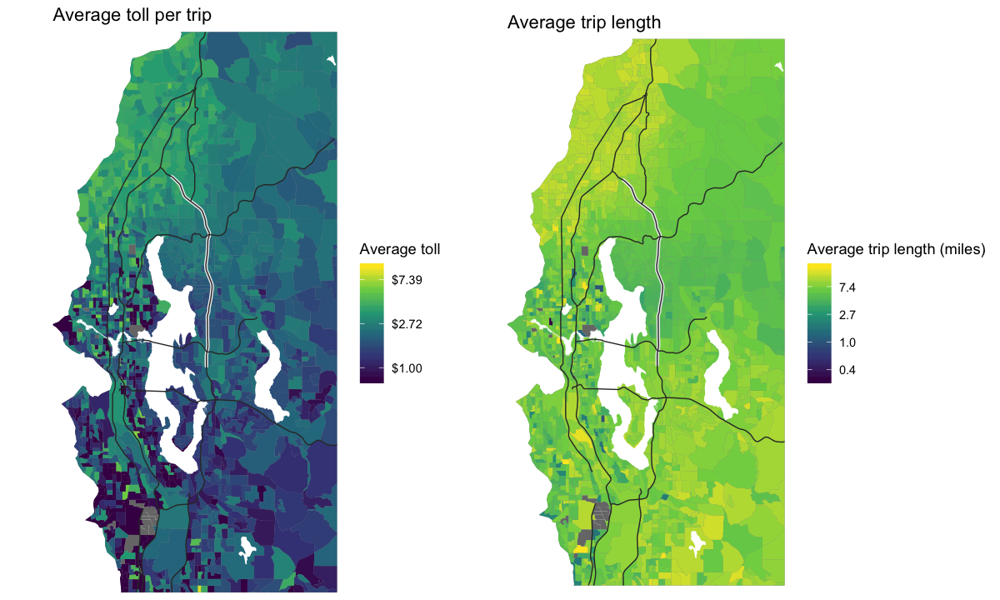

In [193]:
gridExtra::grid.arrange(
    plot_map(benefits_plots, revenue/trips, "Average toll per trip", plot_bg=T) + 
        scale_fill_viridis_c(name="Average toll", labels=scales::dollar, trans="log", oob=scales::squish),
    plot_map(benefits_plots, vmt/trips, "Average trip length", log=T, plot_bg=T) + 
        scale_fill_viridis_c(name="Average trip length (miles)", labels=function(x) scales::number(x, accuracy=0.1), 
                             trans="log", oob=scales::squish),
nrow=1)

# Income and Race

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


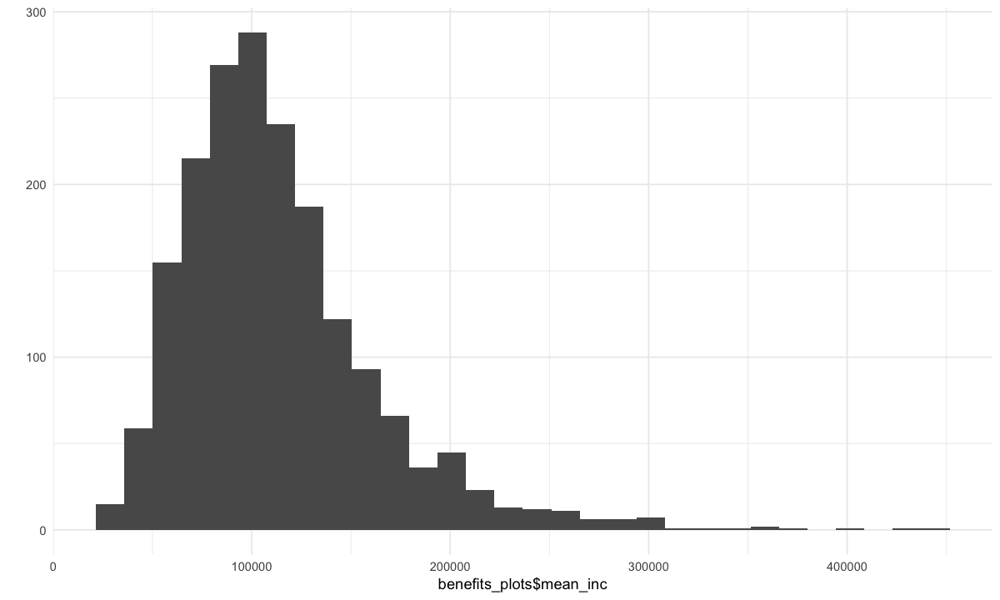

In [478]:
qplot(benefits_plots$mean_inc)

Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.
Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.


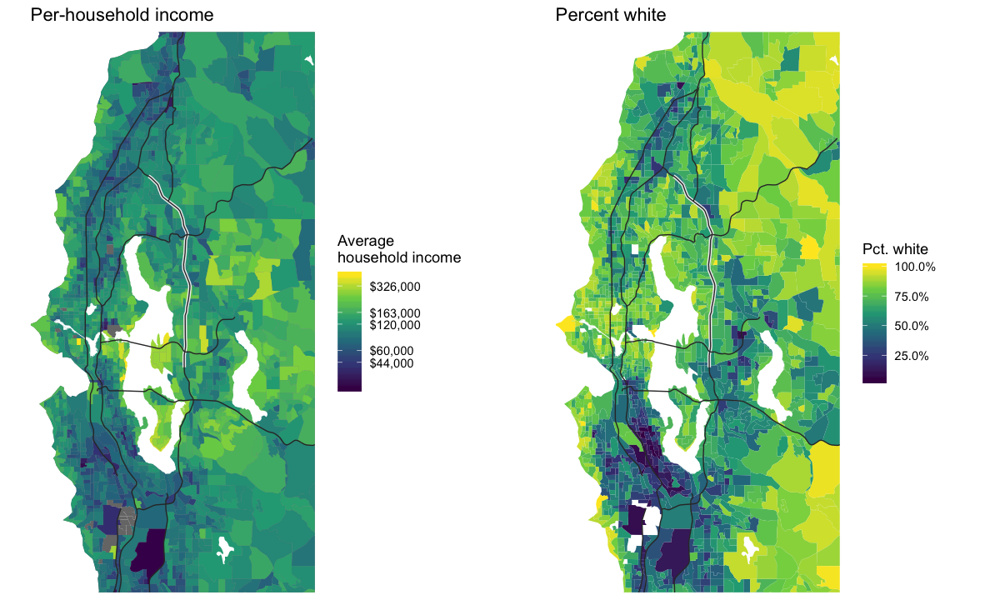

In [194]:
gridExtra::grid.arrange(
    plot_map(benefits_plots, mean_inc, "Per-household income", plot_bg=T) + 
        scale_fill_continuous(name="Average\nhousehold income", 
                              labels=function(x) scales::dollar(round(x/1e3)*1e3), trans="log"),
    plot_map(benefits_plots, race_nonhisp_white, "Percent white") +
        scale_fill_continuous(name="Pct. white", labels=scales::percent),
nrow=1)

In [483]:
ggsave("../../../img/inc_household_map.png", width=5, height=7, dpi=320)

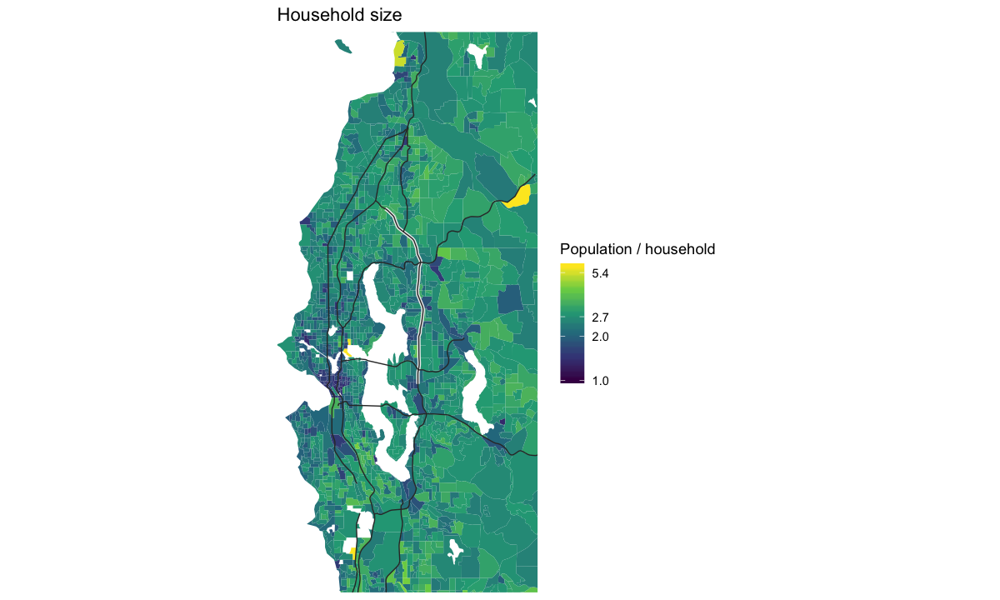

In [410]:
plot_map(benefits_plots, population/households, "Household size", limits=c(1, 6))

# Benefits

Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.
Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.


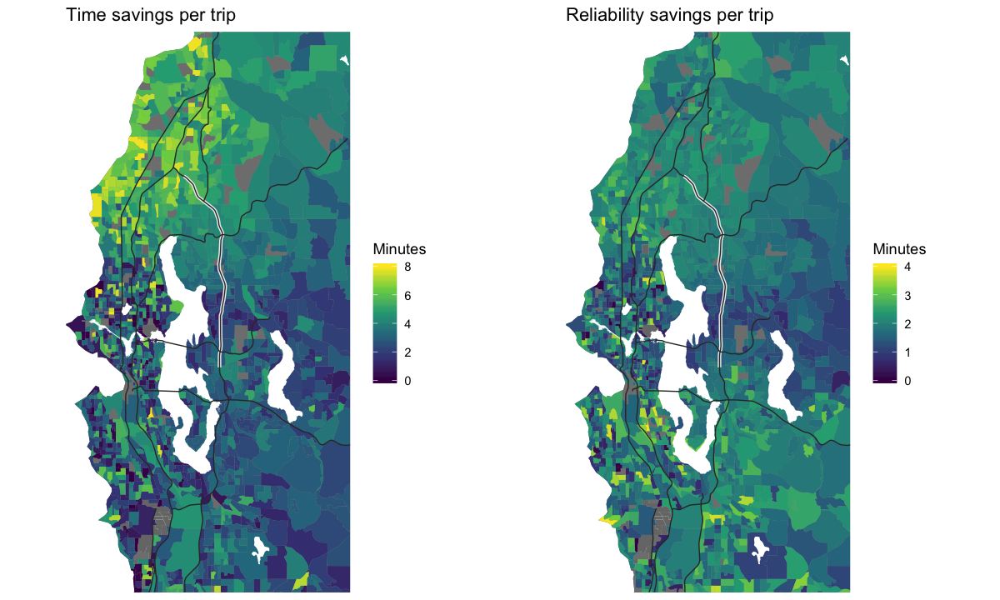

In [53]:
gridExtra::grid.arrange(
    plot_map(benefits_plots, 60*savings/trips, "Time savings per trip", log=F, limits=c(0, 8), plot_bg=T) +
        scale_fill_viridis_c(name="Minutes", limits=c(0, 8)),
    plot_map(benefits_plots, 60*reliability/trips, "Reliability savings per trip", log=F, plot_bg=T) + 
        scale_fill_viridis_c(name="Minutes", limits=c(0, 4)),
nrow=1)


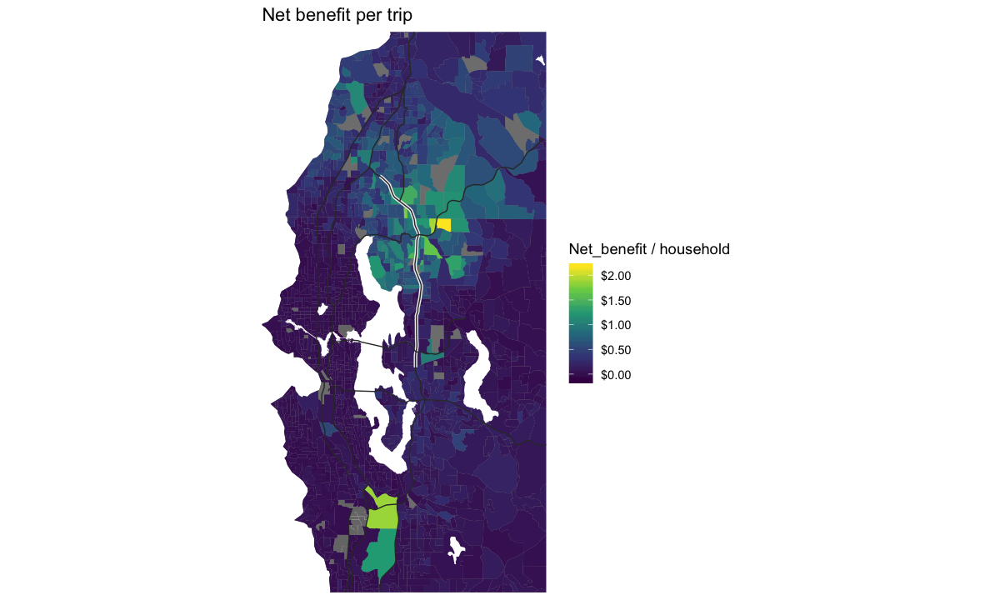

In [37]:
plot_map(benefits_plots, net_benefit/households, "Net benefit per trip", log=F, plot_bg=T)

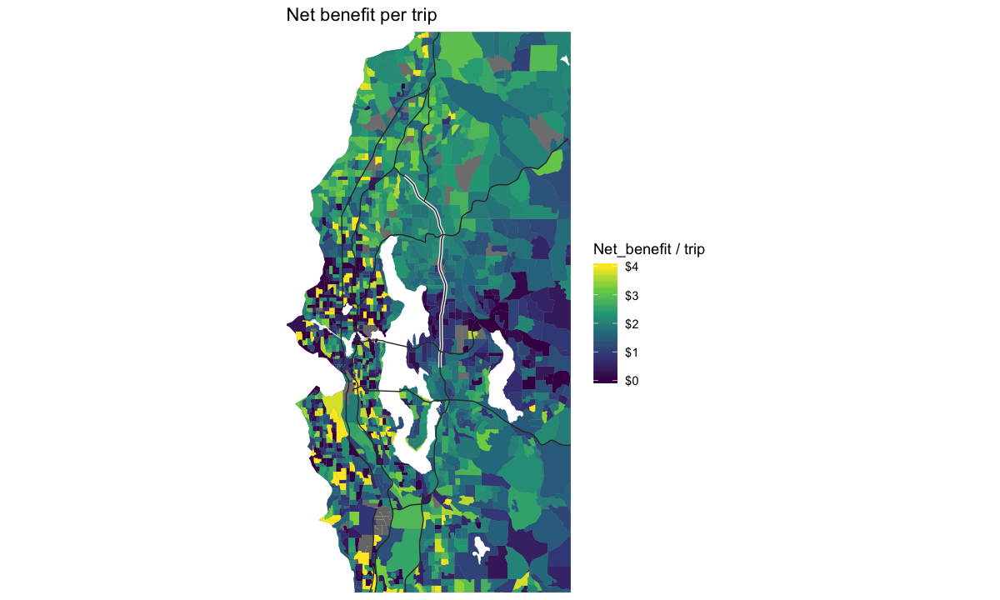

In [16]:
plot_map(benefits_plots, net_benefit/trips, "Net benefit per trip", log=F, limits=c(0, 4), plot_bg=T)

Warning message in self$trans$transform(x):
“NaNs produced”Warning message:
“Transformation introduced infinite values in discrete y-axis”

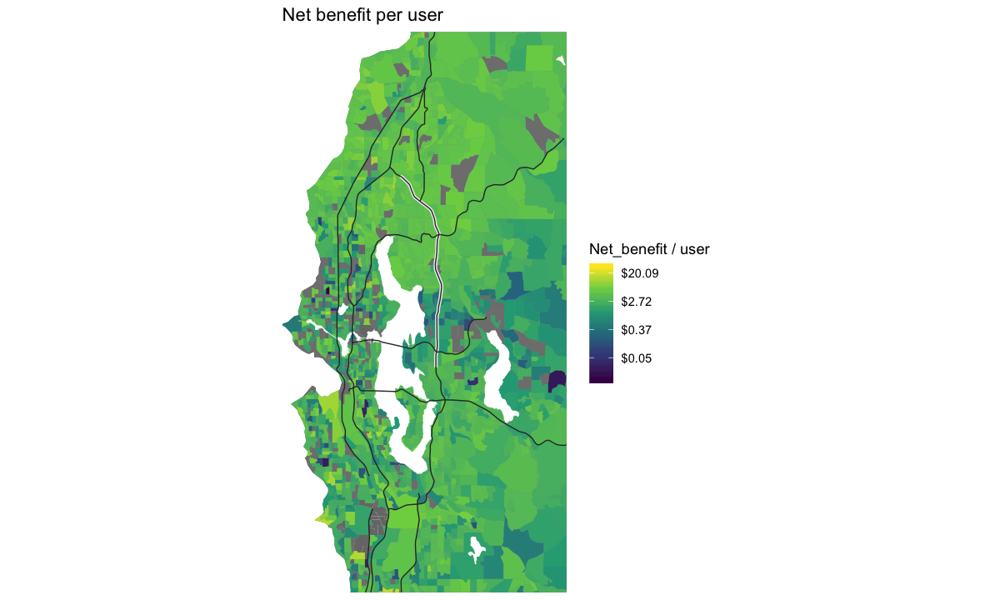

In [17]:
plot_map(benefits_plots, net_benefit/users, "Net benefit per user", plot_bg=T)

Warning message in self$trans$transform(x):
“NaNs produced”Warning message:
“Transformation introduced infinite values in discrete y-axis”

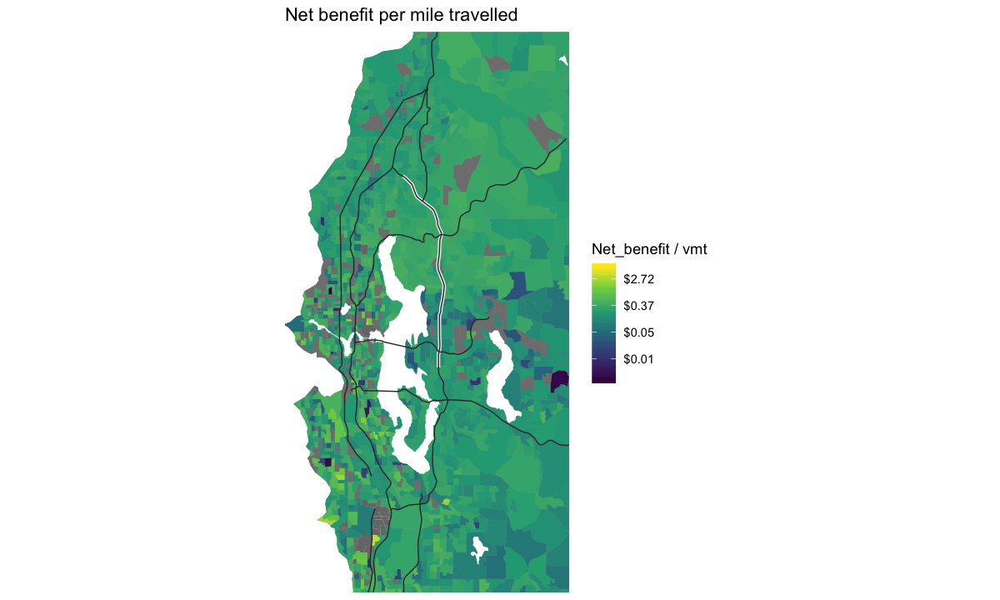

In [18]:
plot_map(benefits_plots, net_benefit/vmt, "Net benefit per mile travelled", plot_bg=T)

Warning message in self$trans$transform(x):
“NaNs produced”Warning message:
“Transformation introduced infinite values in discrete y-axis”

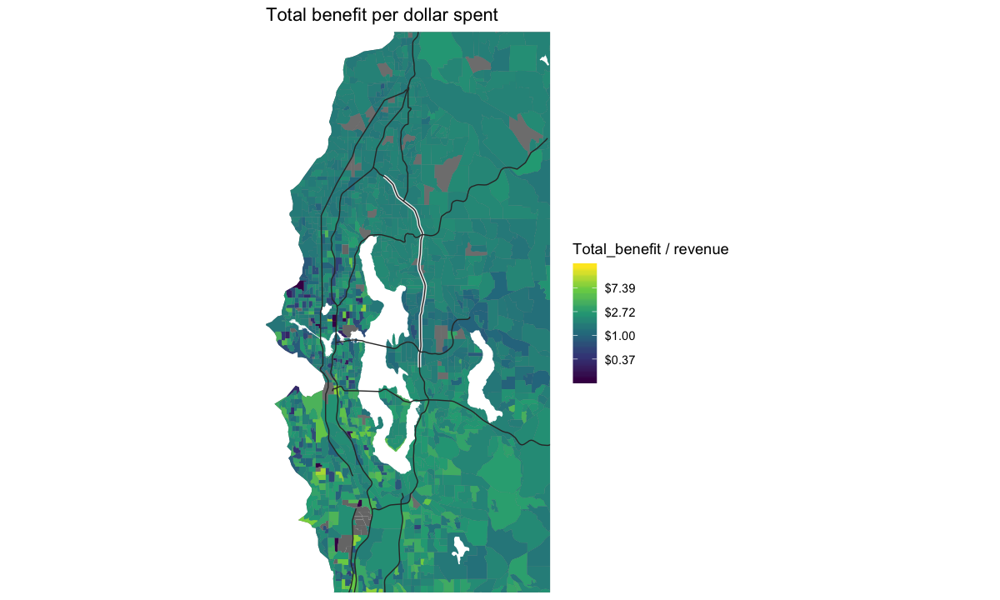

In [19]:
plot_map(benefits_plots, total_benefit/revenue, "Total benefit per dollar spent", limits=c(0.15, NA), plot_bg=T)

## Winners and Losers

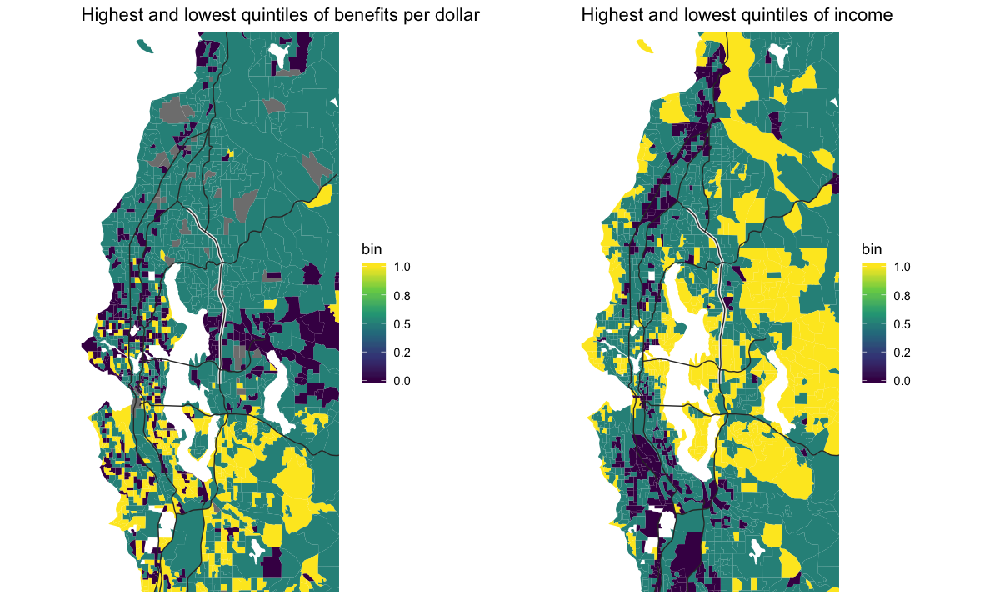

In [49]:
p1 = benefits_plots %>%
    mutate(bucket = ntile(total_benefit/revenue, 5),
           bin = if_else(bucket==5, 1, if_else(bucket==1, 0, 0.5))) %>%
plot_map(bin, "Highest and lowest quintiles of benefits per dollar", log=F)

p2 = benefits_plots %>%
    mutate(bucket = ntile(mean_inc, 5),
           bin = if_else(bucket==5, 1, if_else(bucket==1, 0, 0.5))) %>%
plot_map(bin, "Highest and lowest quintiles of income", log=F)

gridExtra::grid.arrange(p1, p2, nrow=1)

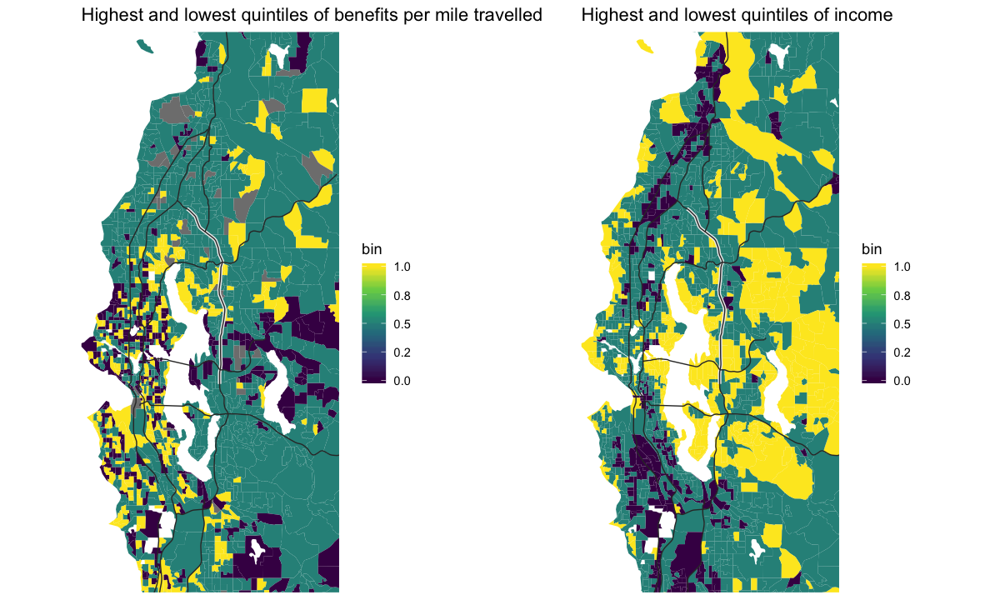

In [50]:
p1 = benefits_plots %>%
    mutate(bucket = ntile(net_benefit/vmt, 5),
           bin = if_else(bucket==5, 1, if_else(bucket==1, 0, 0.5))) %>%
plot_map(bin, "Highest and lowest quintiles of benefits per mile travelled", log=F)

p2 = benefits_plots %>%
    mutate(bucket = ntile(mean_inc, 5),
           bin = if_else(bucket==5, 1, if_else(bucket==1, 0, 0.5))) %>%
plot_map(bin, "Highest and lowest quintiles of income", log=F)

gridExtra::grid.arrange(p1, p2, nrow=1)

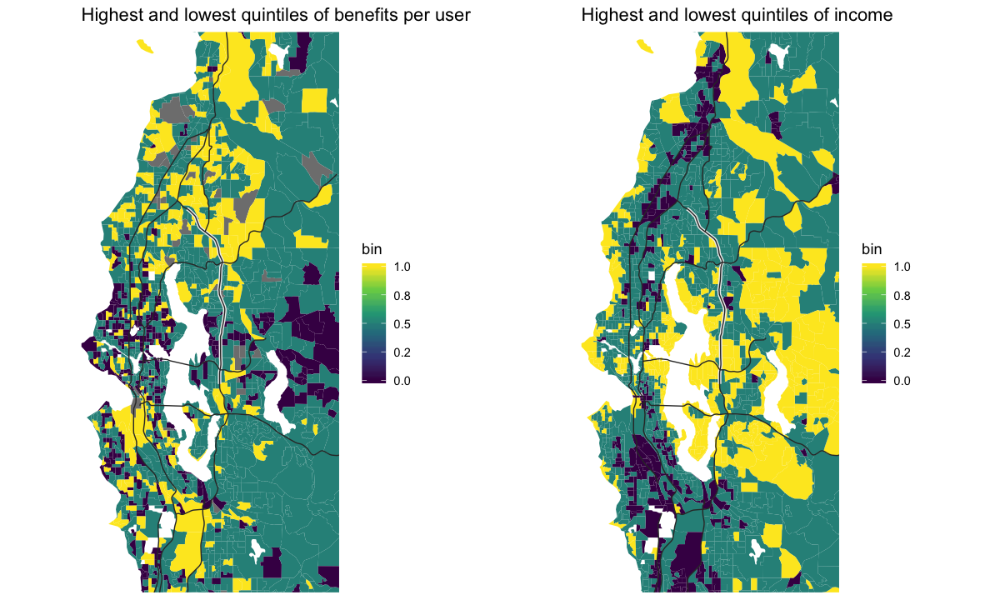

In [51]:
p1 = benefits_plots %>%
    mutate(bucket = ntile(net_benefit/users, 5),
           bin = if_else(bucket==5, 1, if_else(bucket==1, 0, 0.5))) %>%
plot_map(bin, "Highest and lowest quintiles of benefits per user", log=F)

p2 = benefits_plots %>%
    mutate(bucket = ntile(mean_inc, 5),
           bin = if_else(bucket==5, 1, if_else(bucket==1, 0, 0.5))) %>%
plot_map(bin, "Highest and lowest quintiles of income", log=F)

gridExtra::grid.arrange(p1, p2, nrow=1)

Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.
Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.


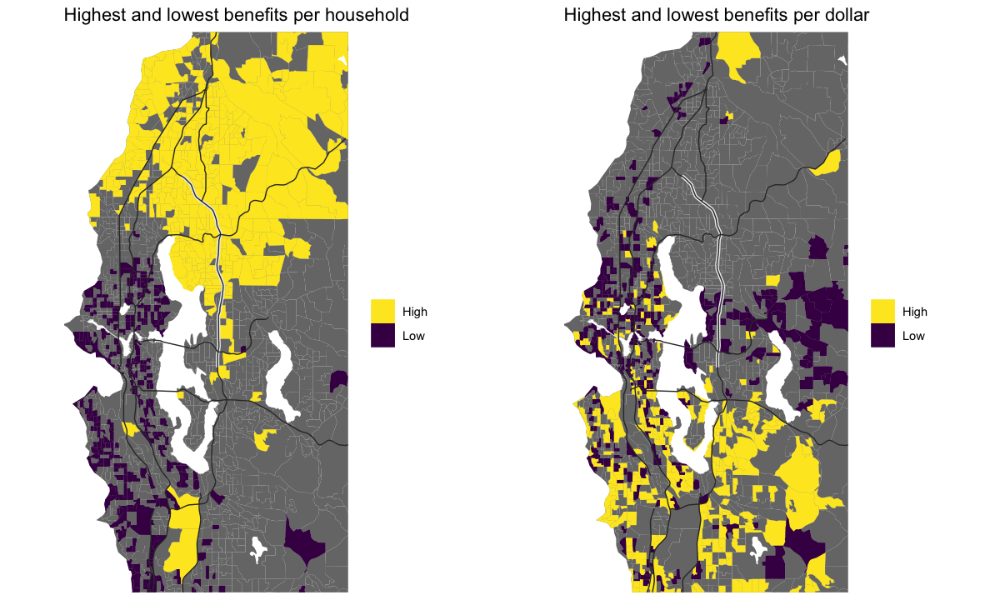

In [54]:
p1 = benefits_plots %>%
    mutate(bucket = ntile(total_benefit/households, 5),
           bin = if_else(bucket==5, "High", if_else(bucket==1, "Low", NULL))) %>%
plot_map(bin, "Highest and lowest benefits per household", log=F, plot_bg=T) + 
    scale_fill_manual(name="", values=c("#fde725", "#440154"), na.translate=F)

p2 = benefits_plots %>%
    mutate(bucket = ntile(total_benefit/revenue, 5),
           bin = if_else(bucket==5, "High", if_else(bucket==1, "Low", NULL))) %>%
plot_map(bin, "Highest and lowest benefits per dollar", log=F, plot_bg=T) +
    scale_fill_manual(name="", values=c("#fde725", "#440154"), na.translate=F)

gridExtra::grid.arrange(p1, p2, nrow=1)

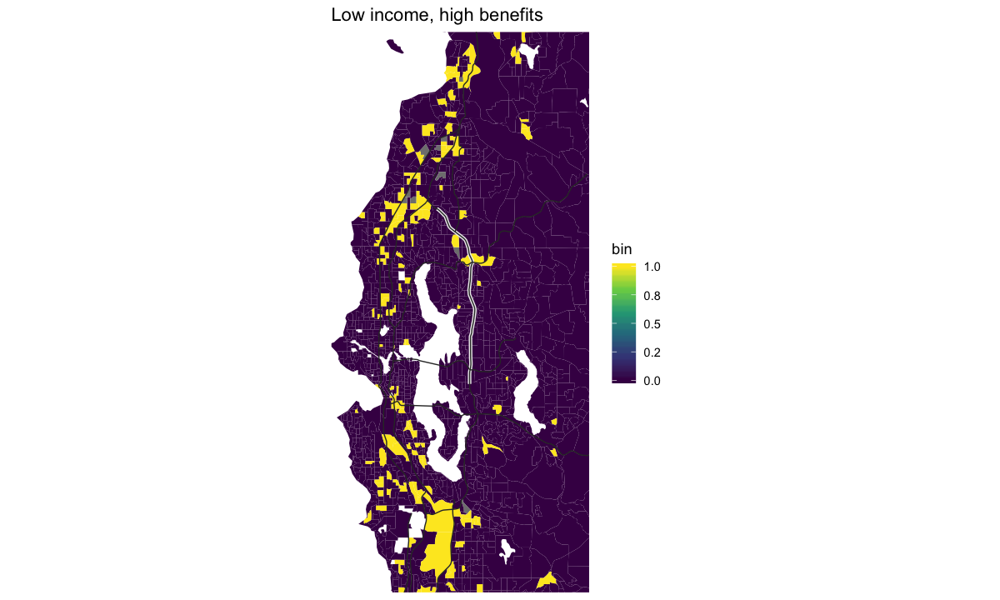

In [52]:
benefits_plots %>%
    mutate(benefit_bucket = ntile(net_benefit/users, 3),
           inc_bucket = ntile(mean_inc, 3),
           bin = as.numeric(benefit_bucket==3 & inc_bucket==1)) %>%
plot_map(bin, "Low income, high benefits", log=F)

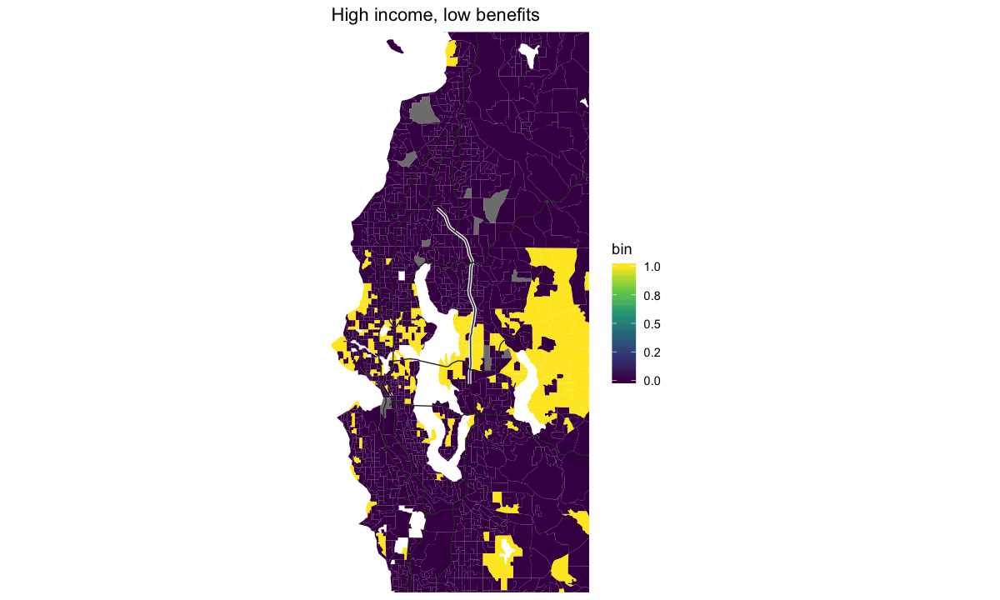

In [53]:
benefits_plots %>%
    mutate(benefit_bucket = ntile(net_benefit/users, 3),
           inc_bucket = ntile(mean_inc, 3),
           bin = as.numeric(benefit_bucket==1 & inc_bucket==3)) %>%
plot_map(bin, "High income, low benefits", log=F)

# The story

In [90]:
benefits.d = fips_benefits %>%
    #filter(county %in% c("King", "Snohomish"), is_hov==0) %>%
    filter(is_hov==0) %>%
    mutate(fips = as.character(fips)) %>%
    left_join(block_groups, by=c("fips"="fips_code")) %>%
    mutate(x = log(mean_inc/1e6),
           t = trips,
           lt = log(trips),
           u = users,
           tu = trips/users,
           nbt = net_benefit/trips,
           nbh = log(net_benefit/households),
           dt = vmt/trips,
           sr = log(savings/reliability),
           tt = log(revenue/trips),
           rt = log(reliability/trips),
           st = log(savings/trips),
           apt = am_peak_trips/trips,
           ppt = pm_peak_trips/trips,
           rpt = rev_comm_trips/trips,
           opt = off_peak_trips/trips,
           rd = log(revenue/vmt)) %>%
    select(fips, tract, county, x, t, u, lt, nbt, dt, tt, rt, st, rd, sr, tu, apt, ppt, rpt, opt, geometry) %>%
    filter(!is.nan(nbt), is.finite(sr), is.finite(nbt), is.finite(lt), is.finite(st)) %>%
    drop_na

Warning message:
“Column `fips`/`fips_code` joining character vector and factor, coercing into character vector”Warning message in log(net_benefit/households):
“NaNs produced”Warning message in log(savings/reliability):
“NaNs produced”Warning message in log(reliability/trips):
“NaNs produced”Warning message in log(savings/trips):
“NaNs produced”

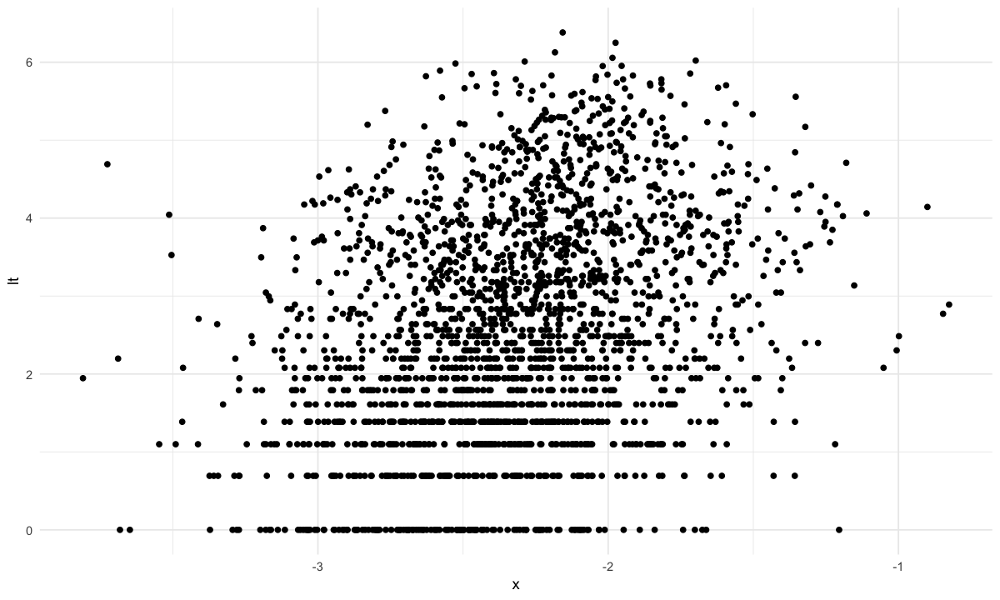

In [93]:
with(benefits.d, qplot(x, lt))

In [138]:
m = suppressMessages(suppressWarnings(
        lm(nbt ~ x*apt+ppt+opt+rpt+x*tu, data=benefits.d, 
             control=lmerControl(check.nobs.vs.nRE="ignore", 
                                 optCtrl=list(ftol_abs=1e-9, xtol_abs=1e-9)))
    ))

In [143]:
m1 = suppressMessages(suppressWarnings(
        lm(nbt ~ apt+ppt+opt+rpt+tu, data=benefits.d, 
             control=lmerControl(check.nobs.vs.nRE="ignore", 
                                 optCtrl=list(ftol_abs=1e-9, xtol_abs=1e-9)))
    ))

In [139]:
m0 = suppressMessages(suppressWarnings(
        lm(nbt ~ x, data=benefits.d, 
             control=lmerControl(check.nobs.vs.nRE="ignore", 
                                 optCtrl=list(ftol_abs=1e-9, xtol_abs=1e-9)))
    ))

In [145]:
summary(m1)


Call:
lm(formula = nbt ~ apt + ppt + opt + rpt + tu, data = benefits.d, 
    control = lmerControl(check.nobs.vs.nRE = "ignore", optCtrl = list(ftol_abs = 0.000000001, 
        xtol_abs = 0.000000001)))

Residuals:
     Min       1Q   Median       3Q      Max 
-11.0584  -0.8570  -0.0662   0.6226  13.0487 

Coefficients:
            Estimate Std. Error t value       Pr(>|t|)    
(Intercept) -4.03183    0.75920  -5.311 0.000000119843 ***
apt          6.84189    0.79230   8.635        < 2e-16 ***
ppt          7.54004    0.78189   9.643        < 2e-16 ***
opt          4.73672    0.76963   6.155 0.000000000887 ***
rpt          6.90156    0.76765   8.991        < 2e-16 ***
tu          -0.08114    0.05988  -1.355          0.176    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1.675 on 2280 degrees of freedom
Multiple R-squared:  0.1147,	Adjusted R-squared:  0.1128 
F-statistic: 59.11 on 5 and 2280 DF,  p-value: < 2.2e-16


In [151]:
anova(m1, m)

Res.Df,RSS,Df,Sum of Sq,F,Pr(>F)
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
2280,6398.048,NA,NA,NA,NA
2277,6318.050,3,79.99794,9.610313,0.000002644608


In [152]:
m3 = suppressMessages(suppressWarnings(
        lmer(nbt ~ apt+ppt+opt+rpt+tu+(1|tract), data=benefits.d, 
             control=lmerControl(check.nobs.vs.nRE="ignore", 
                                 optCtrl=list(ftol_abs=1e-9, xtol_abs=1e-9)))
    ))

In [173]:
m4 = suppressMessages(suppressWarnings(
        lmer(nbt ~ x+apt+ppt+opt+rpt+tu+(1|tract), data=benefits.d, 
             control=lmerControl(check.nobs.vs.nRE="ignore", 
                                 optCtrl=list(ftol_abs=1e-9, xtol_abs=1e-9)))
    ))

In [174]:
AIC(m3, m4)

,df,AIC
,<dbl>,<dbl>
m3,8,8865.276
m4,9,8855.309


In [67]:
benefits.d = fips_benefits %>%
    #filter(county %in% c("King", "Snohomish"), is_hov==0) %>%
    filter(is_hov==0) %>%
    mutate(fips = as.character(fips)) %>%
    left_join(block_groups, by=c("fips"="fips_code")) %>%
    mutate(x = log(mean_inc/1e6),
           t = trips,
           u = users,
           nbt = net_benefit/trips,
           nbh = log(net_benefit/households),
           dt = vmt/trips,
           sr = log(savings/reliability),
           pt = peak_trips/trips,
           rd = log(revenue/vmt)) %>%
    select(fips, tract, county, x, nbt, dt, rd, sr, pt, geometry) %>%
    #filter(!is.nan(nbt), !is.nan(nbh),  is.finite(sr), is.finite(nbt)) %>%
    drop_na

Warning message:
“Column `fips`/`fips_code` joining character vector and factor, coercing into character vector”Warning message in log(net_benefit/households):
“NaNs produced”Warning message in log(savings/reliability):
“NaNs produced”

In [68]:
mb = suppressMessages(suppressWarnings(
        lmer(nbt ~ x + (x|tract), data=benefits.d, 
             control=lmerControl(check.nobs.vs.nRE="ignore", 
                                 optCtrl=list(ftol_abs=1e-9, xtol_abs=1e-9)))
    ))

In [69]:
summary(mb)

Linear mixed model fit by REML ['lmerMod']
Formula: nbt ~ x + (x | tract)
   Data: benefits.d
Control: 
lmerControl(check.nobs.vs.nRE = "ignore", optCtrl = list(ftol_abs = 0.000000001,  
    xtol_abs = 0.000000001))

REML criterion at convergence: 9389.1

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-6.5185 -0.5143 -0.0091  0.4172  6.8420 

Random effects:
 Groups   Name        Variance Std.Dev. Corr
 tract    (Intercept) 2.9377   1.7140       
          x           0.8609   0.9279   1.00
 Residual             3.0075   1.7342       
Number of obs: 2330, groups:  tract, 754

Fixed effects:
            Estimate Std. Error t value
(Intercept)   1.0024     0.2308   4.343
x            -0.3791     0.1014  -3.741

Correlation of Fixed Effects:
  (Intr)
x 0.985 
convergence code: 0
boundary (singular) fit: see ?isSingular


In [89]:
summary(benefits.d$x)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
-3.8094 -2.5875 -2.3210 -2.3201 -2.0579 -0.8255 

In [88]:
log(158e3/1e6)

[1] -1.84516

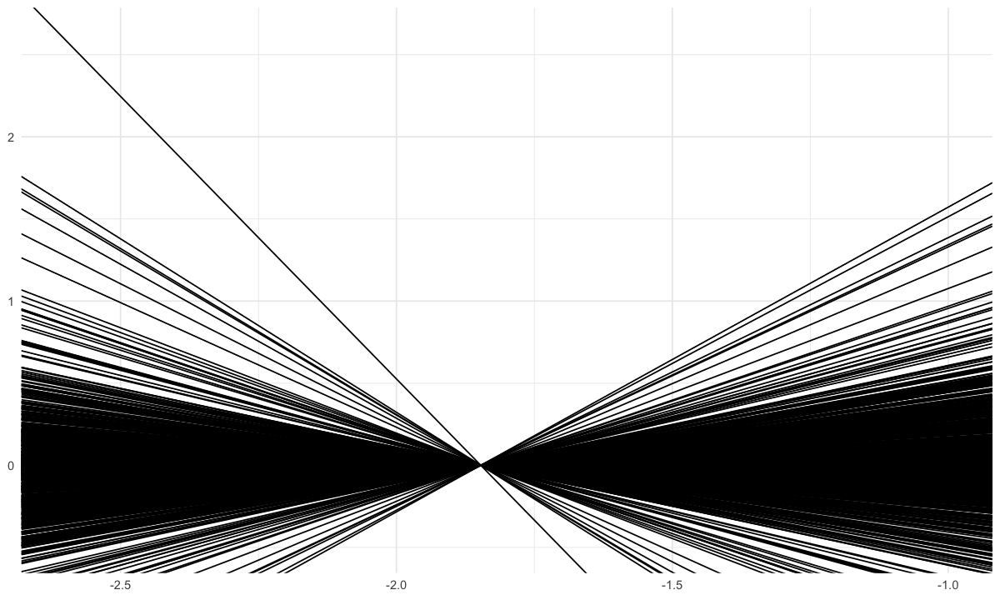

In [90]:
ranef(mb)$tract %>%
ggplot() + 
    geom_abline(aes(slope=x, intercept=`(Intercept)`)) +
    xlim(-2.6, -1) + ylim(-0.5, 2.63)

In [70]:
m = mb
benefits.d$lowinc_resid = (predict(m, newdata=mutate(benefits.d, x=log(36551/1e6)), re.form=NULL)
     - predict(m, newdata=mutate(benefits.d, x=log(36551/1e6)), re.form=~0))
benefits.d$highinc_resid = (predict(m, newdata=mutate(benefits.d, x=log(158490/1e6)), re.form=NULL)
     - predict(m, newdata=mutate(benefits.d, x=log(158490/1e6)), re.form=~0))
benefits.d$highinc_lowinc = (predict(m, newdata=mutate(benefits.d, x=log(158490/1e6)), re.form=NULL)
    - predict(m, newdata=mutate(benefits.d, x=log(36551/1e6)), re.form=NULL))

benefits.d$resid = resid(m)
benefits.d = coef(m)$tract %>%
    rownames_to_column("tract") %>%
    mutate(tract = as.numeric(tract),
           slope = x,
           intercept = `(Intercept)`) %>%
    select(tract, slope, intercept) %>%
    right_join(benefits.d, by="tract") %>%
    mutate(avg.resp = intercept + slope*x,
           resp.med = intercept + slope*log(84.242e3/1e6))

Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.


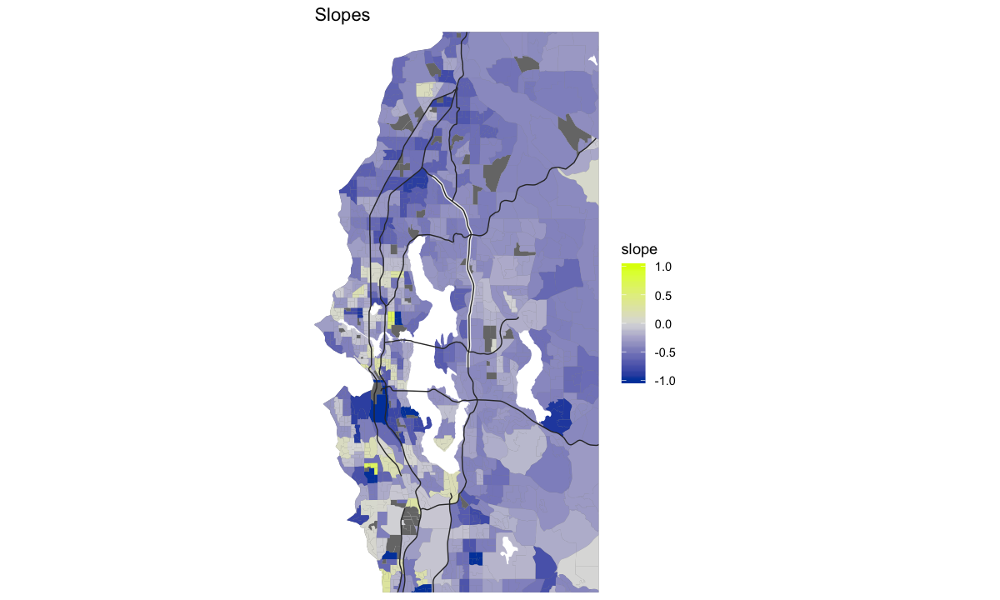

In [30]:
plot_map(benefits.d, slope, "Slopes", log=F, limits=c(-1, 1), plot_bg=T) + 
    scale_fill_gradient2(low="#0044aa", high="#ddff00", mid="#dddddd", midpoint=0, limits=c(-1,1), oob=scales::squish)

Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.


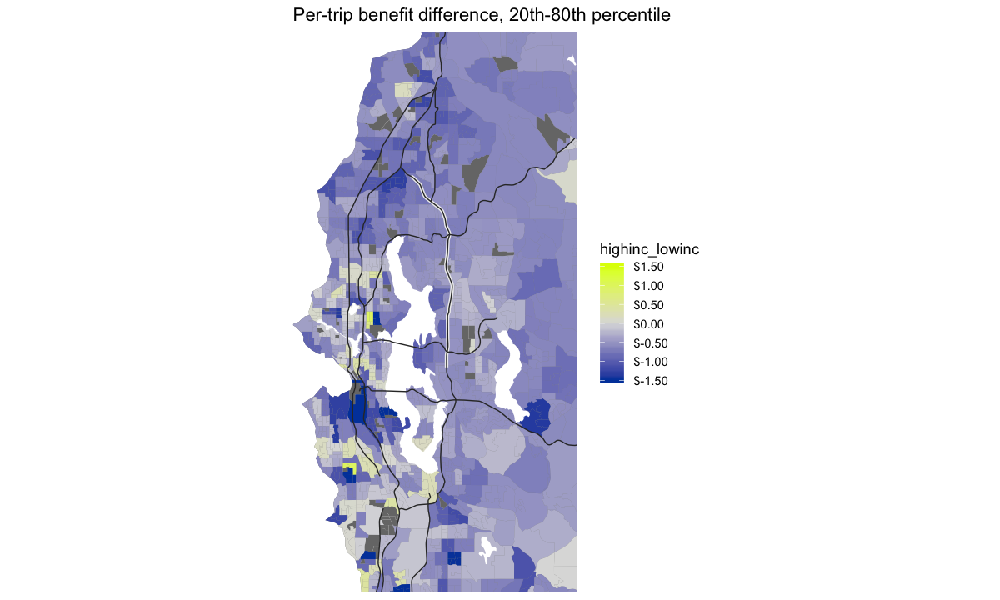

In [71]:
plot_map(benefits.d, highinc_lowinc, "Per-trip benefit difference, 20th-80th percentile", log=F, plot_bg=T) + 
    scale_fill_gradient2(labels=scales::dollar, low="#0044aa", high="#ddff00", mid="#dddddd", midpoint=0, limits=c(-1.5,1.5), oob=scales::squish)

Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.
Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.


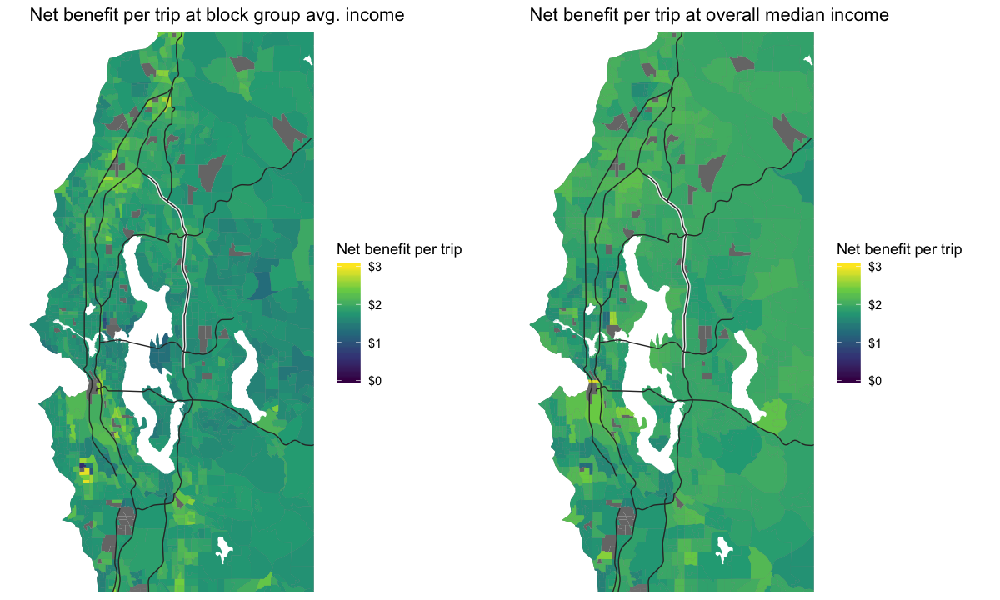

In [64]:
p1 = plot_map(benefits.d, avg.resp, "Net benefit per trip at block group avg. income", log=F, plot_bg=T) +
    scale_fill_viridis_c(labels=scales::dollar, limits=c(0, 3.0), name="Net benefit per trip")

p2 = plot_map(benefits.d, resp.med, "Net benefit per trip at overall median income", log=F, plot_bg=T) +
    scale_fill_viridis_c(labels=scales::dollar, limits=c(0, 3.0), name="Net benefit per trip")

gridExtra::grid.arrange(p1, p2, nrow=1)

In [124]:
ggsave("../../../img/benefit_inc_adj_map.png", width=5, height=7, dpi=320)

Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.


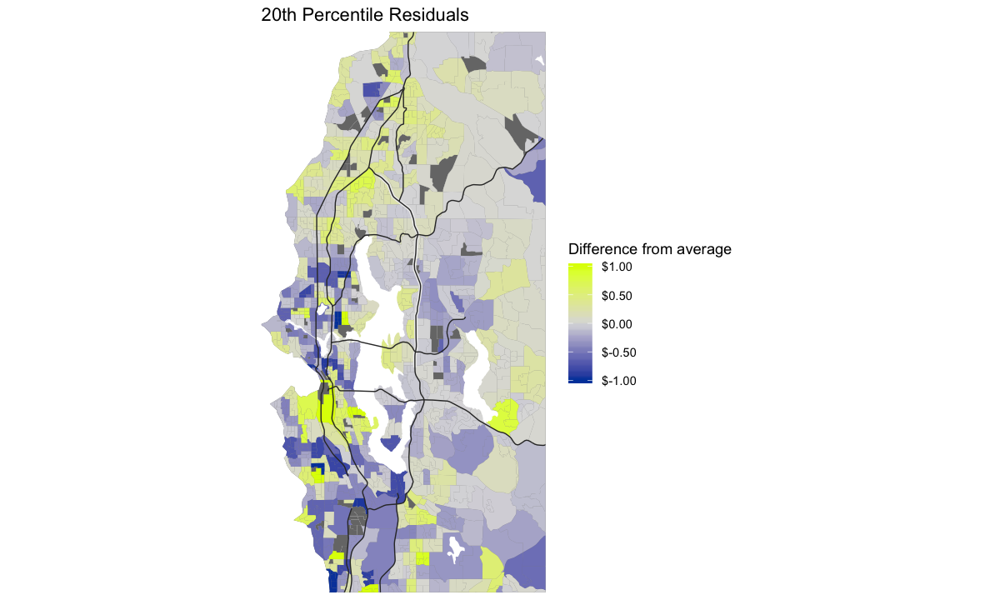

In [91]:
plot_map(benefits.d, lowinc_resid, "20th Percentile Residuals", log=F, plot_bg=T) +
    scale_fill_gradient2(name="Difference from average", labels=scales::dollar, 
                         low="#0044aa", high="#ddff00", mid="#dddddd", midpoint=0, limits=c(-1, 1), oob=scales::squish)

Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.
Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.


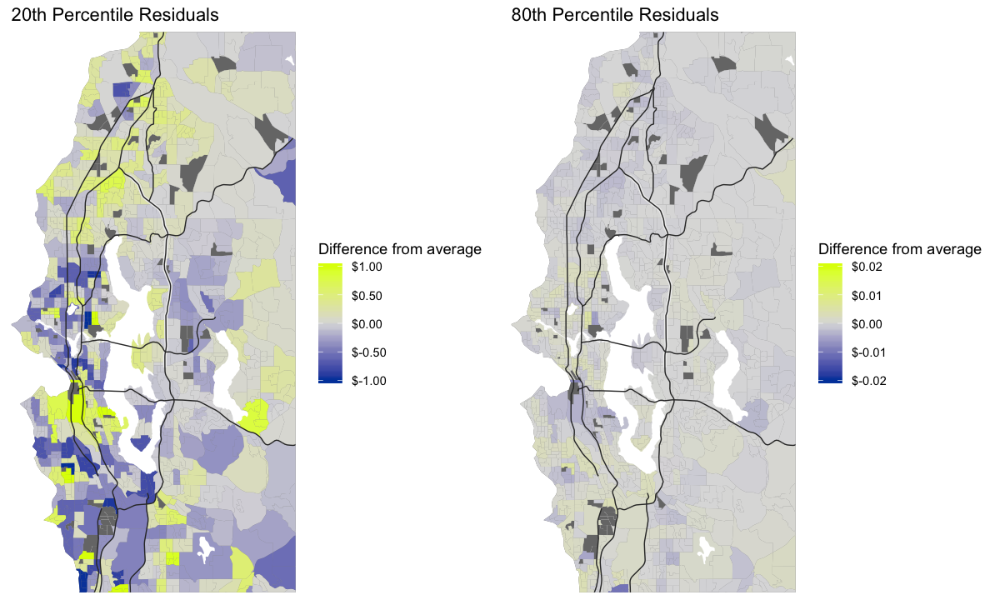

In [79]:
plot_map(benefits.d, highinc_resid, "80th Percentile Residuals", log=F, plot_bg=T) +
    scale_fill_gradient2(name="Difference from average", labels=scales::dollar, 
                         low="#0044aa", high="#ddff00", mid="#dddddd", midpoint=0, limits=c(-0.02, 0.02), oob=scales::squish)


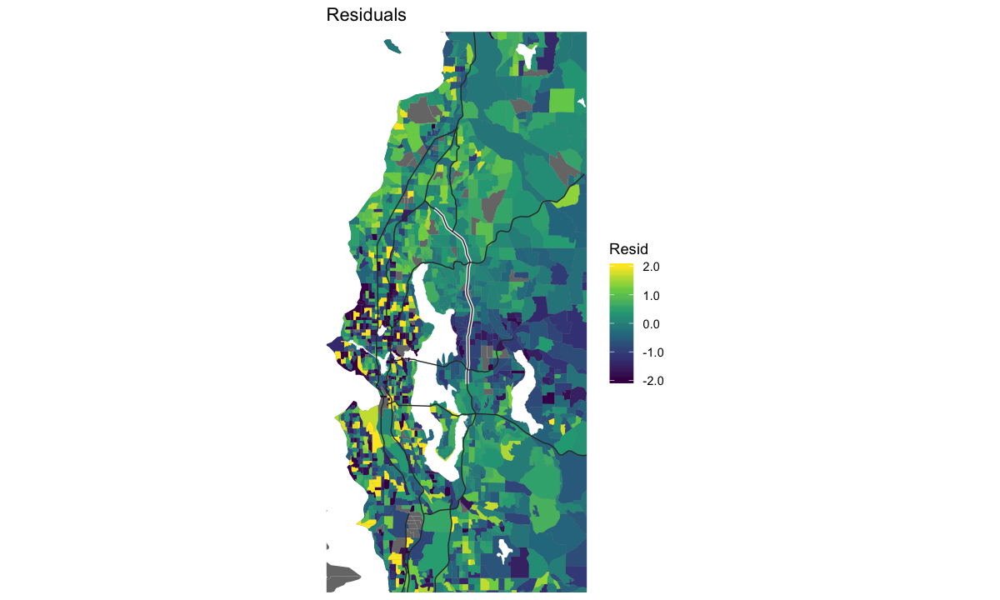

In [117]:
#plot_map(benefits.d, resid, "Residuals", log=F, limits=c(NA, 1.5), plot_bg=T)
plot_map(benefits.d, resid, "Residuals", log=F, limits=c(-2, 2), plot_bg=T)

In [103]:
gc()

,used,(Mb),gc trigger,(Mb),limit (Mb),max used,(Mb)
Ncells,2653163,141.7,5014861,267.9,NA,5014861,267.9
Vcells,5093342,38.9,12255594,93.6,16384,12255594,93.6


ERROR: Error in qinc(0.5, fit_all): object 'fit_all' not found
